In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

In [2]:
pd.options.display.max_columns = 30
pd.options.display.precision = 3
plt.style.use('seaborn-white')
sns.set_style('white')
warnings.filterwarnings('ignore')

In [3]:
bmw = pd.read_csv('bmw.csv')

In [4]:
bmw.head()

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,5 Series,2014,11200,Automatic,67068,Diesel,125,57.6,2.0
1,6 Series,2018,27000,Automatic,14827,Petrol,145,42.8,2.0
2,5 Series,2016,16000,Automatic,62794,Diesel,160,51.4,3.0
3,1 Series,2017,12750,Automatic,26676,Diesel,145,72.4,1.5
4,7 Series,2014,14500,Automatic,39554,Diesel,160,50.4,3.0


In [5]:
bmw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10781 entries, 0 to 10780
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         10781 non-null  object 
 1   year          10781 non-null  int64  
 2   price         10781 non-null  int64  
 3   transmission  10781 non-null  object 
 4   mileage       10781 non-null  int64  
 5   fuelType      10781 non-null  object 
 6   tax           10781 non-null  int64  
 7   mpg           10781 non-null  float64
 8   engineSize    10781 non-null  float64
dtypes: float64(2), int64(4), object(3)
memory usage: 758.2+ KB


In [6]:
from sklearn.model_selection import train_test_split

# splitting dataset
X = bmw.drop(['price'], axis=1)
X['model'] = X['model'].apply(lambda x: x.strip())
y = bmw['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
bmw_train = pd.concat([X_train, y_train], axis=1)
bmw_test = pd.concat([X_test, y_test], axis=1)

# Exploratory Data Analysis

In [7]:
numeric_features = list(X_train.select_dtypes('number'))
category_features = list(X_train.select_dtypes('object'))

## Numeric features

In [8]:
bmw_train.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
year,8624.0,2017.098,2.352,1996.0,2016.00,2017.0,2019.00,2020.0
mileage,8624.0,25320.737,25185.548,1.0,5534.75,17812.0,37843.25,178987.0
tax,8624.0,131.921,61.165,0.0,135.00,145.0,145.00,580.0
mpg,8624.0,56.263,30.559,5.5,45.60,53.3,62.80,470.8
engineSize,8624.0,2.168,0.545,0.0,2.00,2.0,2.00,5.0
price,8624.0,22788.996,11404.024,1200.0,14950.00,20500.0,27976.25,99950.0


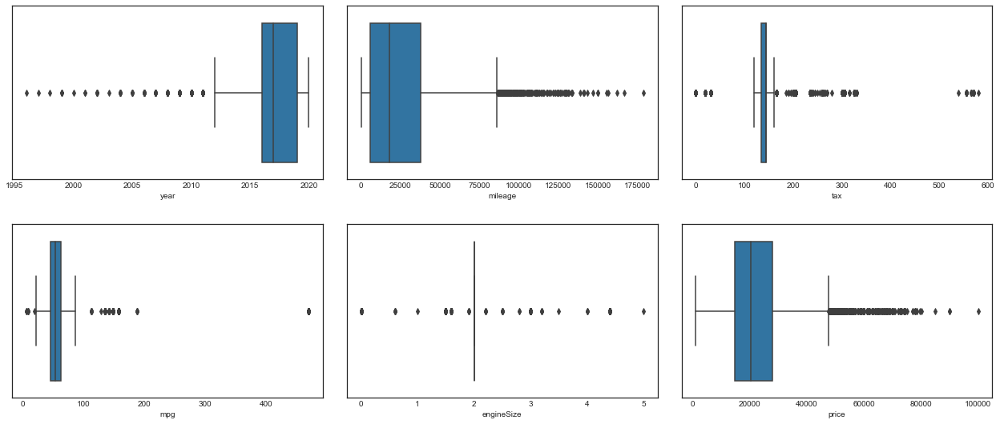

In [9]:
fig, axes = plt.subplots(2, 3, figsize=(18, 8))

for feature, ax in zip(numeric_features + ['price'], axes.flatten()):
    sns.boxplot(ax=ax, data=bmw_train, x=feature)
plt.tight_layout(pad=3)

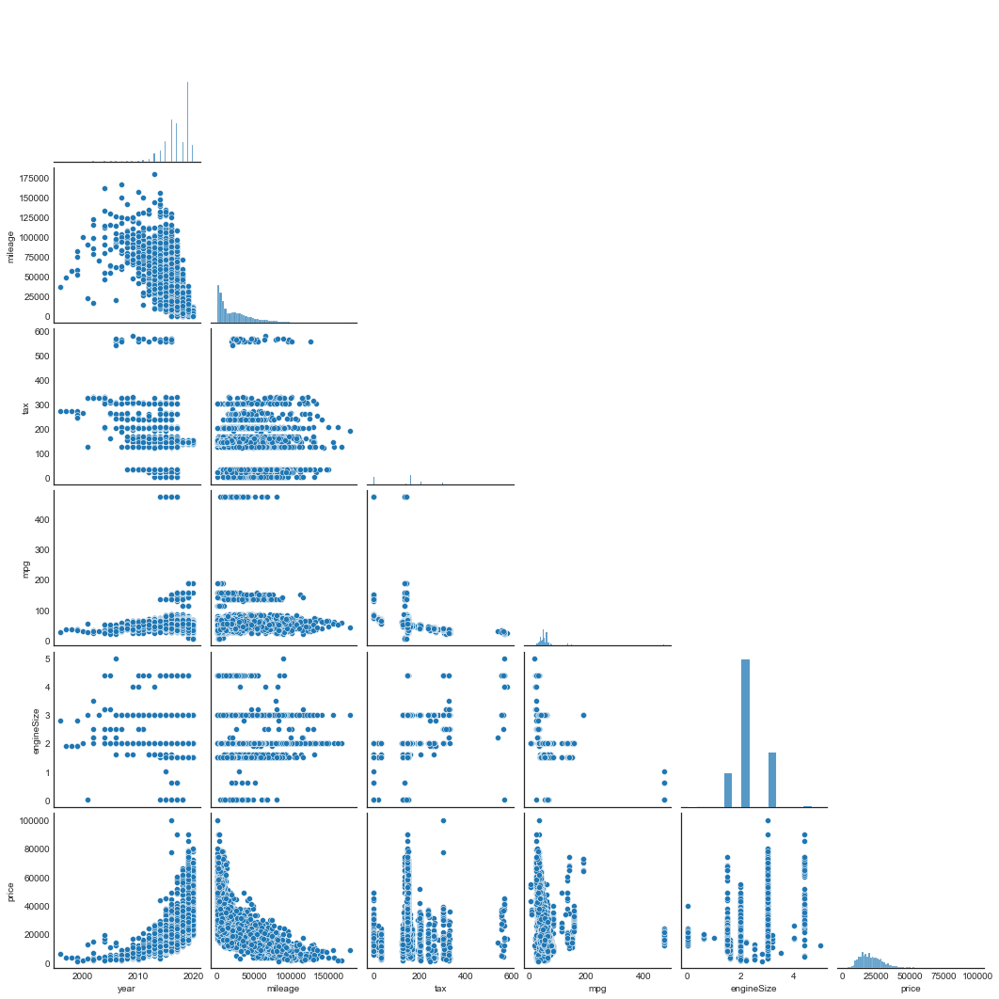

In [10]:
sns.pairplot(bmw_train[numeric_features + ['price']], corner=True);

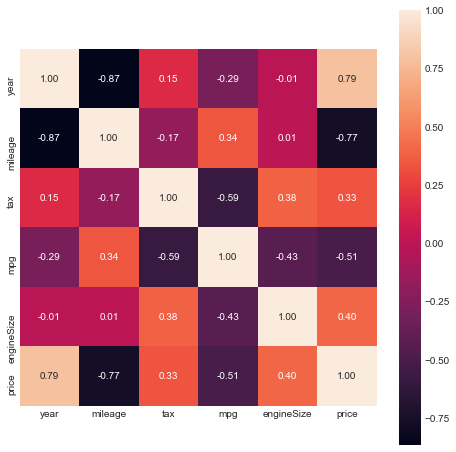

In [11]:
corr_matrix = bmw_train[numeric_features + ['price']].corr(method='spearman')
plt.figure(figsize=(8,8))
sns.heatmap(corr_matrix, annot=corr_matrix, square=True, fmt='.2f');

## Category Features

In [12]:
bmw_train.describe(exclude='number').transpose()

,count,unique,top,freq
model,8624,24,3 Series,1948
transmission,8624,3,Semi-Auto,3769
fuelType,8624,5,Diesel,5655


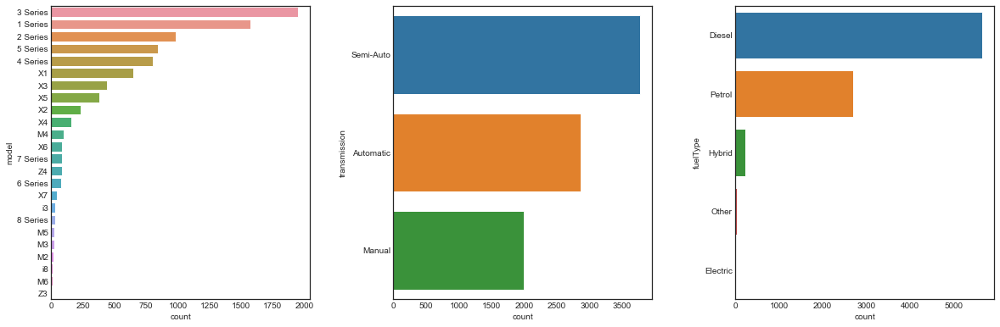

In [13]:
fig, axes = plt.subplots(1, 3, figsize=(17, 6))

for feature, ax in zip(category_features, axes.flatten()):
    sns.countplot(ax=ax, data=bmw_train, y=feature, order=bmw_train[feature].value_counts().index)
plt.tight_layout(pad=3)

In [14]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import f_classif

encoder = OneHotEncoder(handle_unknown='ignore')
X_train_category = encoder.fit_transform(X_train[category_features])

In [15]:
pd.DataFrame({'features': encoder.get_feature_names(), 'p-value': np.round(f_classif(X_train_category, y_train)[1], 3)})

,features,p-value
0,x0_1 Series,0.000
1,x0_2 Series,0.000
2,x0_3 Series,0.002
3,x0_4 Series,0.000
4,x0_5 Series,0.000
5,x0_6 Series,0.000
6,x0_7 Series,0.000
7,x0_8 Series,0.000
8,x0_M2,0.000
9,x0_M3,0.166


# 1. Clustering

In [16]:
from sklearn.preprocessing import RobustScaler
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score

# fitur-fitur yang digunakan untuk ckustering
clustered_cols = ['mileage', 'tax', 'mpg', 'year', 'engineSize', 'price']
bmw_clustered = bmw_train[clustered_cols].copy()
bmw_clustered_prep = RobustScaler().fit_transform(bmw_clustered)

In [17]:
# evaluasi performansi jumlah cluster dari algoritma k-Means
ss_distances = []
sil_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k).fit(bmw_clustered_prep)
    ss_distances.append(kmeans.inertia_)
    sil_scores.append(silhouette_score(bmw_clustered_prep, kmeans.labels_))
cluster_eval = pd.DataFrame({'n_clusters': range(2, 11), 'sum_squared_distances': ss_distances, 'silhouette_score': sil_scores})
cluster_eval

,n_clusters,sum_squared_distances,silhouette_score
0,2,155753.553,0.755
1,3,82714.984,0.778
2,4,57131.777,0.737
3,5,43224.277,0.781
4,6,30856.089,0.689
5,7,25001.562,0.419
6,8,21760.288,0.415
7,9,18913.546,0.452
8,10,16301.635,0.482


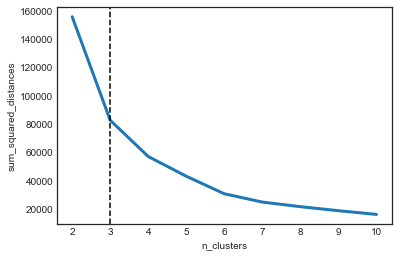

In [18]:
# visualisasi performansi clustring dengan elbow method
sns.lineplot(data=cluster_eval, x='n_clusters', y='sum_squared_distances', linewidth=3)
plt.axvline(x=3, c='k', linestyle='dashed');

In [19]:
# menambahkan kode cluster ke dataframe bmw
best_kmeans = KMeans(n_clusters=3).fit(bmw_clustered_prep)
bmw_clustered['cluster_ix'] = best_kmeans.labels_.reshape(-1, 1)
bmw_clustered.head()

,mileage,tax,mpg,year,engineSize,price,cluster_ix
8139,94938,240,43.5,2010,3.0,9249,2
4902,3150,145,52.3,2019,1.5,25995,0
8380,54013,30,62.8,2016,2.0,13235,1
4060,4899,145,30.4,2019,2.0,31995,0
6541,34003,145,46.3,2017,2.0,16995,0


In [20]:
# Summary statistics untuk setiap cluster mobil bmw, dimulai dari cluster 0 hingga cluster 2
for i in range(0, 3):
    display(bmw_clustered[bmw_clustered['cluster_ix'] == i].describe().transpose().iloc[:-1, :])

,count,mean,std,min,25%,50%,75%,max
mileage,6906.0,19962.145,22281.387,1.0,4378.5,10862.0,29233.75,178987.0
tax,6906.0,147.588,14.778,120.0,145.0,145.0,150.00,205.0
mpg,6906.0,52.797,22.980,5.5,44.8,51.4,57.70,470.8
year,6906.0,2017.628,2.000,2001.0,2017.0,2018.0,2019.00,2020.0
engineSize,6906.0,2.195,0.537,0.0,2.0,2.0,3.00,4.4
price,6906.0,24985.600,11334.935,1445.0,17499.0,22892.0,29770.00,89990.0


,count,mean,std,min,25%,50%,75%,max
mileage,1438.0,46362.008,23410.997,10.0,29437.5,41496.5,60195.0,149958.0
tax,1438.0,21.898,11.096,0.0,20.0,30.0,30.0,30.0
mpg,1438.0,77.032,49.850,53.3,62.8,65.7,70.6,470.8
year,1438.0,2015.459,1.262,2008.0,2015.0,2016.0,2016.0,2017.0
engineSize,1438.0,1.867,0.295,0.0,2.0,2.0,2.0,2.0
price,1438.0,13056.889,3941.953,2450.0,10688.5,12700.0,14990.0,48998.0


,count,mean,std,min,25%,50%,75%,max
mileage,280.0,49424.643,30314.658,771.0,25643.0,40088.5,69087.0,141000.0
tax,280.0,310.554,95.391,235.0,260.0,300.0,305.0,580.0
mpg,280.0,35.079,4.689,19.1,34.0,35.8,37.7,44.8
year,280.0,2012.432,4.600,1996.0,2010.0,2014.0,2016.0,2017.0
engineSize,280.0,3.042,0.587,0.0,3.0,3.0,3.0,5.0
price,280.0,18592.654,11592.857,1200.0,11494.0,16990.0,23422.5,99950.0


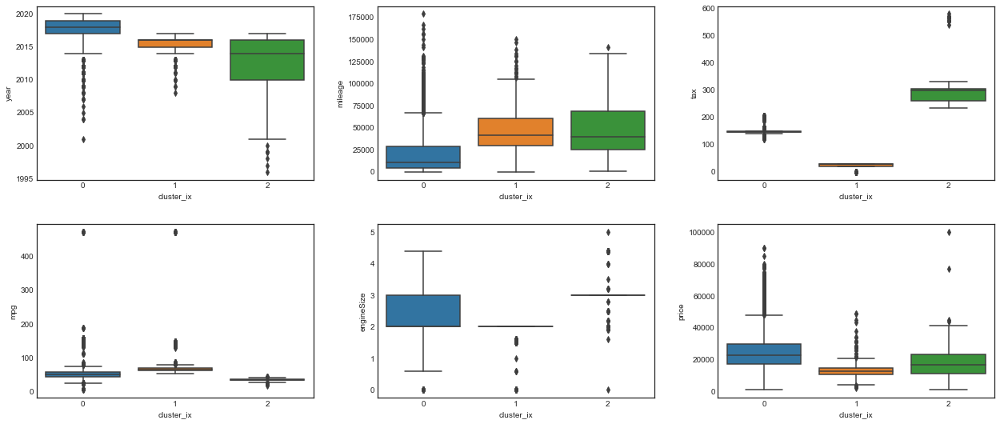

In [21]:
# Visualisasi boxplot untuk masing-masing cluster mobil bmw
fig, axes = plt.subplots(2, 3, figsize=(18, 8))

for feature, ax in zip(numeric_features + ['price'], axes.flatten()):
    sns.boxplot(ax=ax, data=bmw_clustered, x='cluster_ix', y=feature)
plt.tight_layout(pad=3);

Berdasarkan hasil evaluasi k-Means, 3 cluster adalah jumlah cluster yang memiliki silhouette score tertinggi sekaligus penurunan sum of square distance terbesar pada elbow method. Berikut merupakan 3 cluster yang terbentuk pada data harga mobil bmw bekas di Inggris.

### Cluster 0 (Cluster BMW Tipe Keluaran Terbaru)
Cluster 0 merupakan kumpulan mobil mayoritas keluaran tahun 2017-2019. Terdapat 6906 mobil yang menjadi anggota Cluster 0. Sebanyak 75% kumpulan mobil ini masih memiliki jarak tempuh penggunaan yang relatif rendah, yaitu di bawah 30.000 km. Biaya pajaknya tidak terlalu mahal ataupun murah, masih dalam rentang \$120 hingga \$205. Efisiensi penggunaan bahan bakar dari kumpulan mobil ini cukup baik dengan rata-rata sebesar 52,79 mpg. Ukuran mesin yang digunakan mayoritas berukuran 2 hingga 3. Jika dilihat dari segi biaya, kumpulan mobil memiliki rata-rata harga tertinggi, yaitu sebesar \$25.000.

### Cluster 1 (Cluster BMW Irit)
Cluster 1 merupakan kumpulan mobil mayoritas keluaran 2015-2016. Terdapat 1438 mobil yang menjadi anggota Cluster 1. Jarak tempuh penggunaan relatif lebih besar dibandingkan dengan Cluster 0 karena memang mobil sudah digunakan terlebih dahulu. Sebanyak 75% jarak tempuh mobil dalam rentang 30.000 km hingga 60.000 km. Biaya pajaknya sangat rendah, dimulai dari \$0 hingga \$30. Selain itu, kumpulan mobil ini punya rata-rata efisiensi penggunaan bahan bakar tertinggi, yaitu sebesar 77,03 mpg. Ukuran mesin yang digunakan berukuran di bawah 2. Sama halnya dengan pajak, kumpulan mobil ini punya harga jual yang paling rendah dibandingkan cluster lainnnya. Rata-rata harga jual mobil sebesar \$13.000.

### Cluster 2 (Cluster BMW Tipe Keluaran Lama)
Cluster 2 merupakan kumpulan mobil mayoritas keluaran 2010-2016 dan sekitar 25% keluaran tahun dibawah 2010 (paling lama tahun 1996). Jarak tempuh penggunaannya tidak berbeda jauh dengan Cluster 1, yaitu dalam rentang 30.000 km hingga 60.000 km. Dibandingkan kedua cluster sebelumnya, biaya pajak kumpulan mobil ini paling besar, yaitu berada dalam rentang \$235 hingga \$580. Kumpulan mobil ini punya efisiensi penggunaan bahan bakar yang paling buruk (teknologi mesin lama), yaitu 35,08 mpg. Ukuran mesin yang digunakan sangat bervariasi dari ukuran 0 hingga 5. Rata-rata harga jual kumpulan mobil ini tidak setinggi Cluster 0, tetapi tidak serendah Cluster 1, yaitu sebesar \$18.500.

# 2. Prediction Modeling
Preprocessing data dilakukan dengan menggunakan fungsi berikut:
- **RobustScaler**: standarisasi data numerik agar skala yang sama. Digunakan RobustScaler karena data distribusinya skewed dan punya banyak outlier
- **OrdinalScaler**: membuat fitur year dan engineSize ke dalam bentuk ordinal
- **OneHotEncoder**: membuat fitur kategori menjadi numerik
- **PolynomialFeatures**: menghasilkan fitur baru yang merupakan hasil kuadrat dari setiap fitur beserta dengan interaksi antar fitur

Seluruh fitur digunakan dalam prediksi harga mobil bmw bekas karena masing-masing memiliki pengaruh yang cukup besar terhadap target variabel (price). Untuk fitur numerik atau ordinal dapat dilihat dari nilai korelasi pada tahap EDA, sedangka untuk fitur kategori dapat dilihat dari mayoritas nilai p-value hasil ANOVA (f_classif) yang di bawah confidence level (type I error) 

In [22]:
from sklearn.preprocessing import RobustScaler, OrdinalEncoder
from sklearn.compose import ColumnTransformer

scaled_cols = ['mileage', 'tax', 'mpg']
ordinal_cols = ['year', 'engineSize']
onehot_cols = ['model', 'transmission', 'fuelType']

scaler = RobustScaler()
onehot_encoder = OneHotEncoder(handle_unknown='ignore')
ordinal_encoder = OrdinalEncoder(handle_unknown='ignore')

transformer = ColumnTransformer([
    ('scaler', scaler, scaled_cols),
    ('ordinal', ordinal_encoder, ordinal_cols),
    ('onehot', onehot_encoder, onehot_cols),
])

Untuk kasus prediksi harga mobil bmw digunakan supervised machine learning sederhana (**Linear Regression**) untuk mengetahui performansi benchmarknya. Dilakukan cross validation dengan hyperparameter tuning untuk `fit_intercept`. Berdasarkan hasil evaluasi terhadap metrics `root mean squared error` atau RMSE, model terbaik adalah Linear Regression dengan nilai `fit_intercept=False` dengan nilai 3100,94. Jika model ini digunakan untuk memprediksi test set, nilai RMSE yang dihasilkan sebesar 3782,54.

In [23]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

model_pipeline = Pipeline([
    ('transformer', transformer),
    ('poly', PolynomialFeatures(degree=2)),
    ('linearregression', LinearRegression(n_jobs=-1))
])

param_grid = {
    'linearregression__fit_intercept': [True, False]
} 
grid = GridSearchCV(model_pipeline, param_grid, cv=3, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)

best_model = grid.best_estimator_
print(f'Best parameters    : {best_model.named_steps["linearregression"]}')
print(f'Best CV RMSE score : {np.sqrt(-grid.best_score_)}')
print(f'Test RMSE score    : {np.sqrt(mean_squared_error(y_test, best_model.predict(X_test)))}')

Best parameters    : LinearRegression(fit_intercept=False, n_jobs=-1)
Best CV RMSE score : 3102.5512187326312
Test RMSE score    : 3779.7006387000015


Model kedua yang digunakan adalah Lasso Regression. Model ini memberikan nilai koefisien 0 terhadap fitur yang tidak memberikan pengaruh signifikan terhadap target variabel. Hasil cross validation dengan model Lasso Regresssion memberikan nilai RMSE yang lebih baik daripada model Linear Regression, yaitu 2830.75. Model ini juga memberikan sedikit peningkatan saat digunakan untuk memprediksi test set dengan nilai RSME sebesar 3745.15.

In [24]:
from sklearn.linear_model import Lasso

model_pipeline = Pipeline([
    ('transformer', transformer),
    ('poly', PolynomialFeatures(degree=2)),
    ('lasso', Lasso(max_iter=5000, tol=0.03))
])

param_grid = {
    'lasso__alpha': [0.1, 1, 10],
    'lasso__fit_intercept': [True, False],
} 
grid = GridSearchCV(model_pipeline, param_grid, cv=3, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
best_model = grid.best_estimator_
print(f'Best parameters    : {grid.best_estimator_.named_steps["lasso"]}')
print(f'Best CV RMSE score : {np.sqrt(-grid.best_score_)}')
print(f'Test RMSE score    : {np.sqrt(mean_squared_error(y_test, best_model.predict(X_test)))}')

Best parameters    : Lasso(alpha=1, max_iter=5000, tol=0.03)
Best CV RMSE score : 2837.0938573015064
Test RMSE score    : 3757.3715936794256


In [25]:
onehot_encoded_cols = best_model.named_steps['transformer'].named_transformers_['onehot'].get_feature_names()
onehot_encoded_cols = [col[3:] for col in onehot_encoded_cols]
dict_values = scaled_cols + ordinal_cols + onehot_encoded_cols
dict_keys = [f'x{i}' for i in range(len(dict_values))]
dict_features = dict(zip(dict_keys, dict_values))
dict_features

{'x0': 'mileage',
 'x1': 'tax',
 'x2': 'mpg',
 'x3': 'year',
 'x4': 'engineSize',
 'x5': '1 Series',
 'x6': '2 Series',
 'x7': '3 Series',
 'x8': '4 Series',
 'x9': '5 Series',
 'x10': '6 Series',
 'x11': '7 Series',
 'x12': '8 Series',
 'x13': 'M2',
 'x14': 'M3',
 'x15': 'M4',
 'x16': 'M5',
 'x17': 'M6',
 'x18': 'X1',
 'x19': 'X2',
 'x20': 'X3',
 'x21': 'X4',
 'x22': 'X5',
 'x23': 'X6',
 'x24': 'X7',
 'x25': 'Z3',
 'x26': 'Z4',
 'x27': 'i3',
 'x28': 'i8',
 'x29': 'Automatic',
 'x30': 'Manual',
 'x31': 'Semi-Auto',
 'x32': 'Diesel',
 'x33': 'Electric',
 'x34': 'Hybrid',
 'x35': 'Other',
 'x36': 'Petrol'}

Jika dilihat dari nilai coefficient model Lasso Regression, mayoritas variabel independen yang memberikan pengaruh signfikan terhadap variabel dependen (price) adalah interaksi antar fitur. Dari 10 fitur dengan nilai koefisien tertinggi, interaksi antara suatu fitur dengan `mpg` muncul sebanyak 6 kali. Hal ini menunjukkan bahwa fitur interaksi mpg dengan fitur lain memiiki pern penting dalam prediksi harga jual mobil bmw di Inggris.

In [26]:
coefficients = np.abs(best_model.named_steps['lasso'].coef_)
feature_names = best_model.named_steps['poly'].get_feature_names()

feature_coef = pd.DataFrame({'feature_names': feature_names, 'coefficients': coefficients})
feature_coef = feature_coef[feature_coef['coefficients'] != 0].sort_values(by='coefficients', ascending=False)
feature_coef[:10]

,feature_names,coefficients
273,x6 x34,11021.548
133,x2 x24,10410.955
132,x2 x23,9347.723
53,x0 x15,7767.952
137,x2 x28,5739.486
127,x2 x18,5656.383
602,x20 x34,5479.298
131,x2 x22,5439.090
145,x2 x36,5410.179
1,x0,4845.922
